# w/wo IAA augment 
## DataSet increase N times
#### install require package 
#### parameter1 :sour_destination_folder
#### parameter2 :dest_destination_folder

In [1]:
!pip install six numpy scipy Pillow matplotlib scikit-image opencv-python imageio
!pip install --no-dependencies imgaug



['./dataset/images/GH012582_480.jpg', './dataset/images/GH012582_240.jpg']
Normal Picture:!



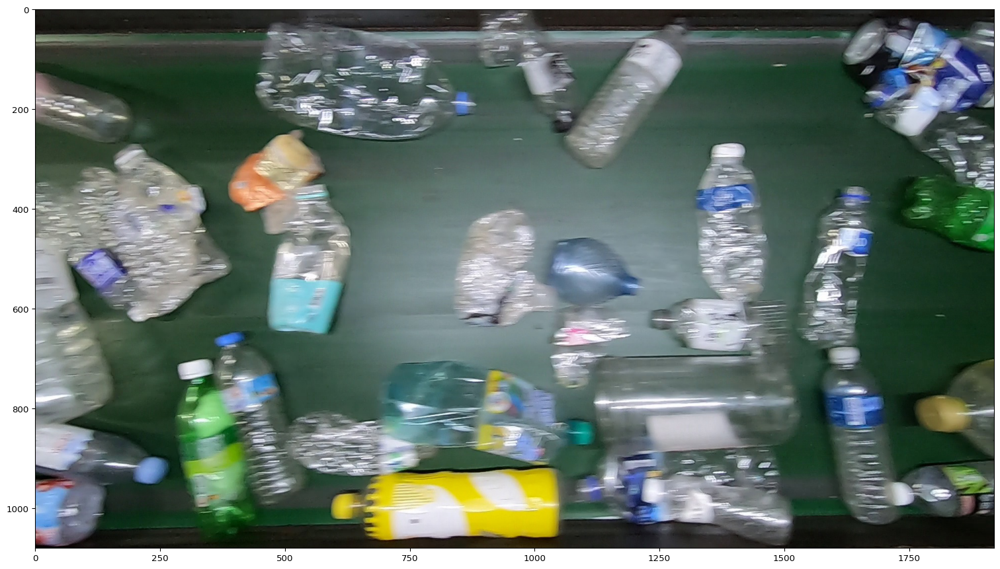

Rotate Picture:!

GH012582_480_0


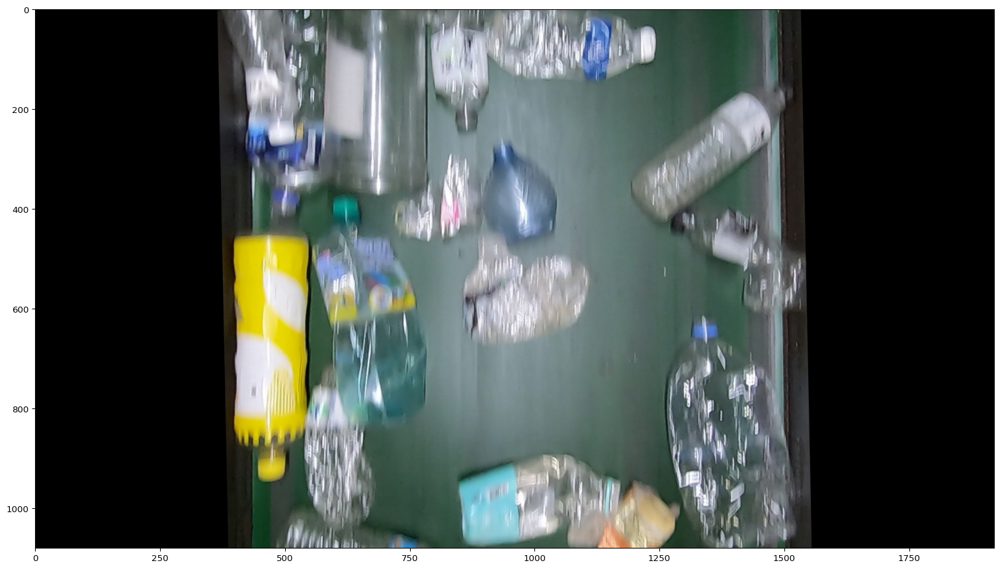

GH012582_480_180


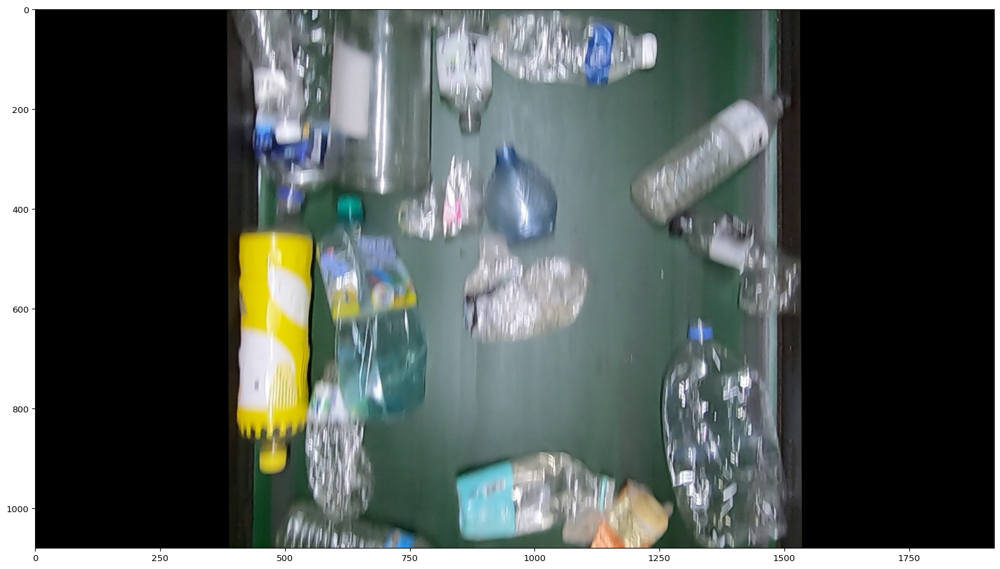

Rotate Picture:!

GH012582_240_0


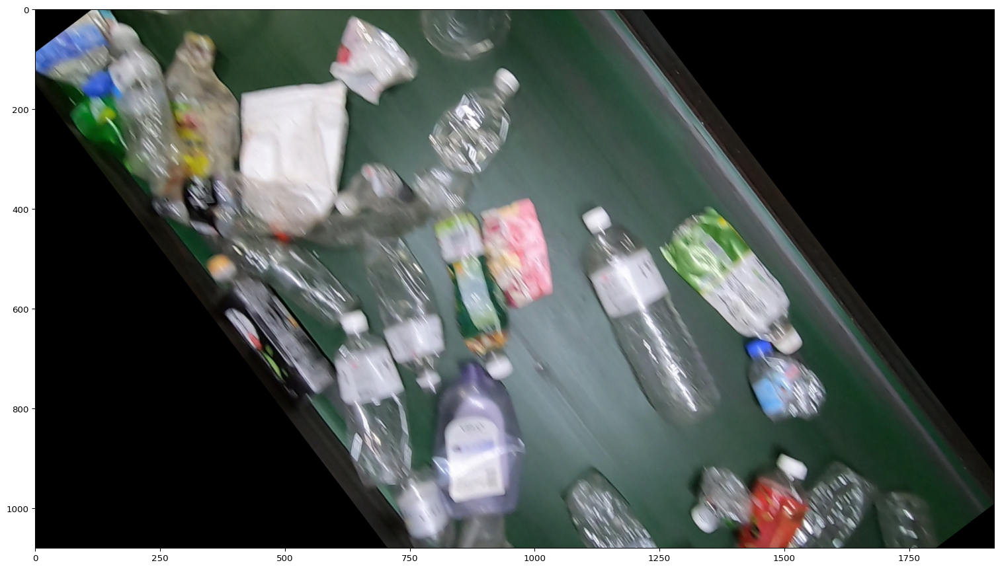

GH012582_240_180


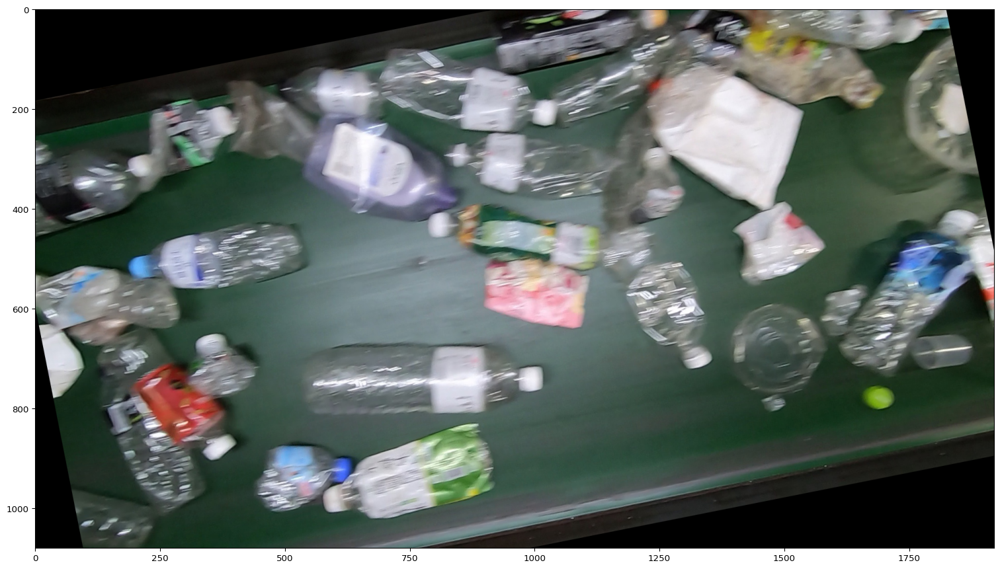

In [2]:
from imgaug import augmenters as iaa
import imageio
import imgaug as ia
import os,glob
%matplotlib inline
ia.seed(6)
os.getcwd()
 
def iaa_aug_data_woBB(sour,dest, func , val, rotate = False, angle_interval = None):
 
    if not os.path.exists(dest):
        os.makedirs(dest)
 
    l_fileSet = glob.glob(sour+"/images/*.jpg")
    print (l_fileSet)
    image = imageio.imread(l_fileSet[0])
    print("Normal Picture:!\n")
    ia.imshow(image)
    for id in range(len(l_fileSet)):
        image = imageio.imread(glob.glob(sour+"/images/*.jpg")[id])
 
        fname = l_fileSet[id].split("/")[-1].split(".jpg")[0]
        
        print("Rotate Picture:!\n")
        
        if rotate == False:
            angle_interval = 0x0

        for angle in range(0,360,angle_interval):
            seq = iaa.Sequential([
            iaa.Flipud(0.5),
            iaa.Fliplr(0.5),
            iaa.Affine(
            scale=(0.9, 1.1),
            rotate=(angle, angle+angle_interval)),
            { 
                "crop": iaa.Sometimes(0.1,iaa.Crop( percent=(val) )),
                "contrast": iaa.LinearContrast((val), per_channel=1),
                #iaa.Crop( percent=(val)),
            }.get(func,None)
            ], random_order=True)
            print(fname+ "_" + str(angle))
            ia.imshow(seq(image=image))
            imageio.imwrite("{}.jpg".format(dest+"/"+fname+ "_" + str(angle)), seq(image=image))


sour_folder = "./dataset"
dest_folder = "./out_aug_data"
iaa_aug_data_woBB(sour_folder,dest_folder,"crop", 0.1,True, 180 )

In [5]:
import numpy as np
import cv2
from glob import glob
import os
import argparse


def mkdir_p(dirname):
    if not os.path.isdir(dirname):
        os.mkdir(dirname)


# label and coord are bounding box of yolo and opencv format respectively
# yolo format: <category> <x center> <y center> <width_bbox> <height_bbox> ; range: 0-1
# opencv format: <category> <x_left> <y_top> <x_right> <y_bottom> ; range: 0-width_image or 0-height_image
def label2coord(label,
                height_image,
                width_image):
    category = label[0]
    x_center_bbox = float(label[1])
    y_center_bbox = float(label[2])
    width_bbox = float(label[3])
    height_bbox = float(label[4])
    x_left = int((x_center_bbox - width_bbox / 2.) * width_image)
    x_right = int((x_center_bbox + width_bbox / 2.) * width_image)
    y_top = int((y_center_bbox - height_bbox / 2.) * height_image)
    y_bottom = int((y_center_bbox + height_bbox / 2.) * height_image)
    return category, x_left, y_top, x_right, y_bottom


def coord2label(coord,
                height_image,
                width_image):
    category = coord[0]
    x_left = float(coord[1])
    y_top = float(coord[2])
    x_right = float(coord[3])
    y_bottom = float(coord[4])
    x_center_bbox = (x_left + x_right) / 2. / width_image
    y_center_bbox = (y_top + y_bottom) / 2. / height_image
    width_bbox = (x_right - x_left) / width_image
    height_bbox = (y_bottom - y_top) / height_image
    return category, x_center_bbox, y_center_bbox, width_bbox, height_bbox


def show(image, time_interval):
    cv2.imshow("image", image)
    key = cv2.waitKey(time_interval)
    if key == ord("q"):
        quit()

# of images: 2


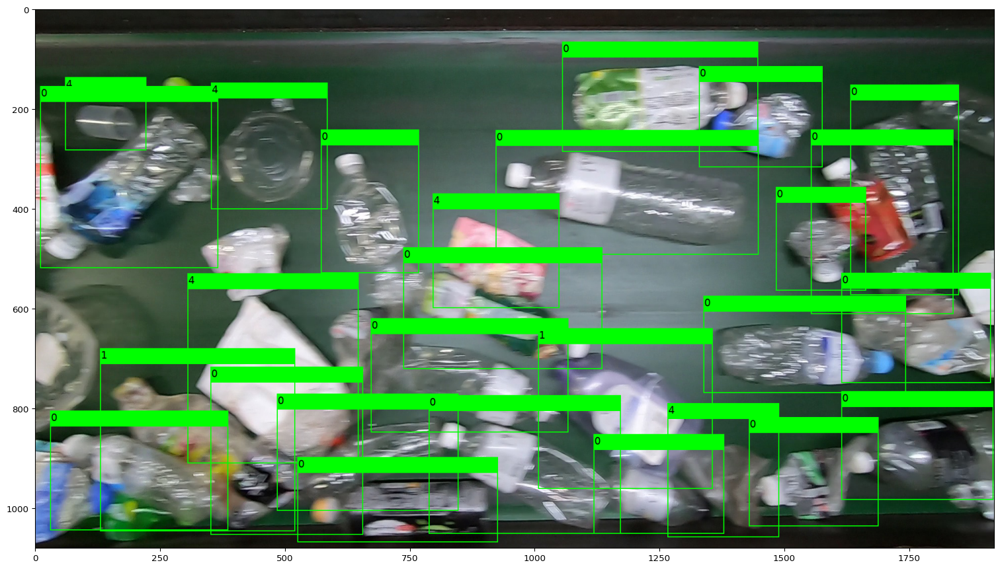

--5--: 180


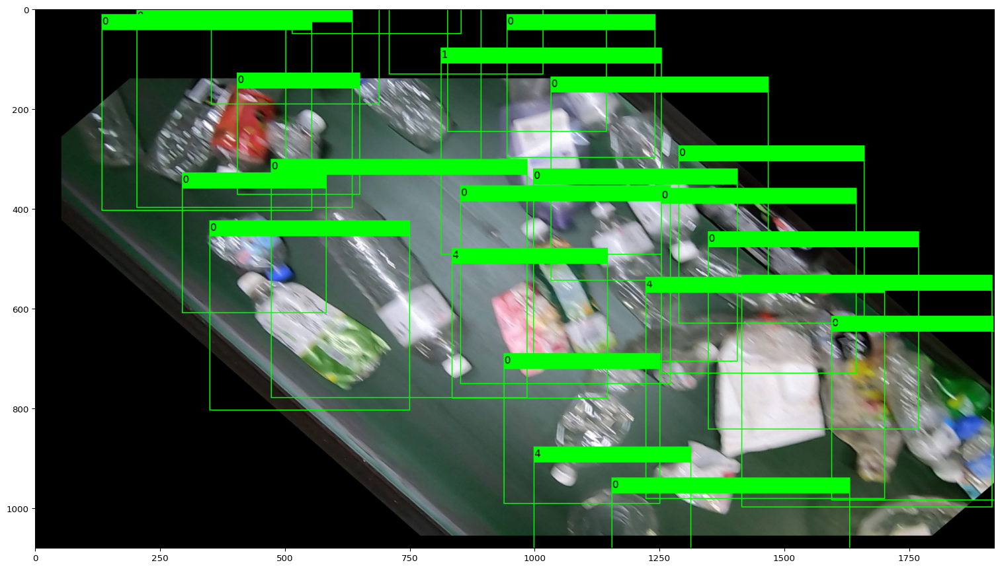

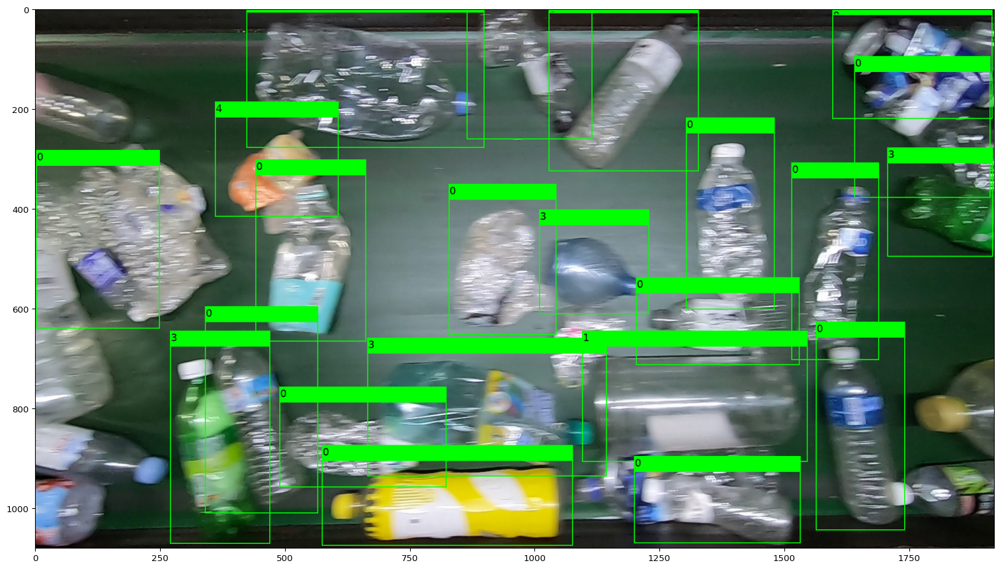

--5--: 180


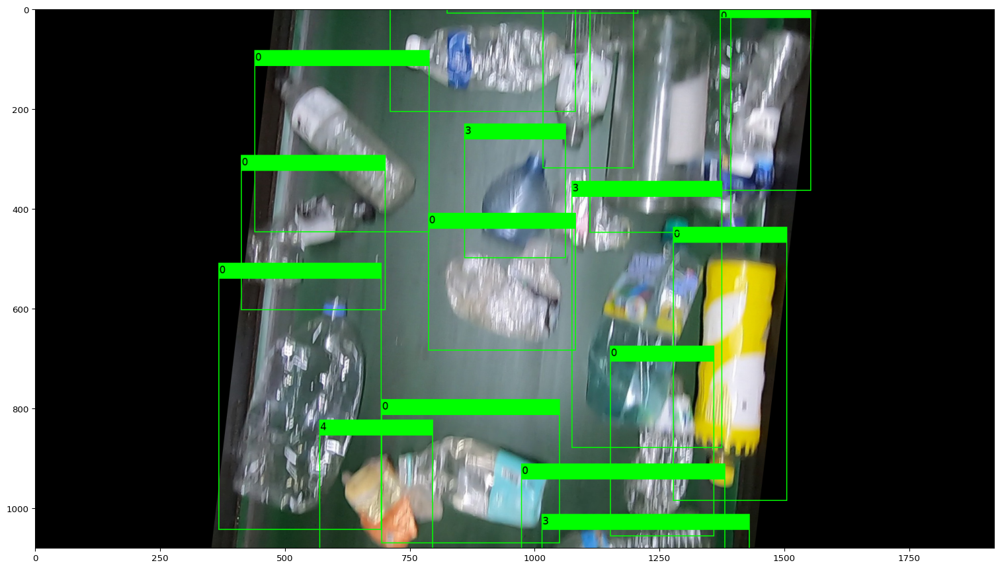

In [6]:
from imgaug import augmenters as iaa
import imageio
import imgaug as ia
import os,glob
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

%matplotlib inline
ia.seed(6)
os.getcwd()

def iaa_aug_data_withBB( args_in, args_out,func , val, rotate = True,  args_angle=None):
        dirname_input_image = os.path.join( args_in , "images")
        dirname_input_label = os.path.join( args_in , "labels")
        dirname_output_image = os.path.join(args_out , "images")
        dirname_output_label = os.path.join(args_out , "labels")
      
        show_image = False
        angle_interval = int(args_angle)
   
        if rotate == False:
            angle_interval = 0x0
        
        if not show_image:
            mkdir_p(args_out)
            mkdir_p(dirname_output_image)
            mkdir_p(dirname_output_label)

        image_names = sorted(glob.glob(dirname_input_image + "/*"))
        print("# of images: %d" % len(image_names))

        for image_name0 in image_names:
            label_name = os.path.join(dirname_input_label, os.path.splitext(os.path.basename(image_name0))[0] + ".txt")
            
            with open(label_name, "r") as f0:
                labels0 = f0.read().splitlines() # f0.readlines()
#                 print("--3--:",type(labels0 ),labels0)
                
            image0 = imageio.imread(image_name0)
            
            height_image0, width_image0 = image0.shape[:2]
            
            coords = []
            bb =[]
            
            for label in labels0:
#                 print("--4--:",type(label),label.split() )
                label = label.split()
                coord = label2coord(label, height_image0, width_image0)

                coords.append([coord[0], coord[1], coord[2], coord[3], coord[4]])
                bb.append( BoundingBox(label=coord[0] , x1=coord[1], y1=coord[2], x2=coord[3], y2=coord[4]) )
            

            bbs = BoundingBoxesOnImage(bb, shape=image0.shape)                
            sometimes = lambda aug: iaa.Sometimes(0.1, aug)
            for angle in range(0,360,int(angle_interval)):
                image_name = os.path.join(dirname_output_image,
                                          os.path.splitext(os.path.basename(image_name0))[0] + "_%03d" % angle + ".jpg")
                label_name_out = os.path.join(dirname_output_label,
                                          os.path.splitext(os.path.basename(image_name0))[0] + "_%03d" % angle + ".txt")

                if angle == 0:
                    seq = iaa.Sequential()
                else:
                    print("--5--:",angle )
                    seq = iaa.Sequential([
                        iaa.Affine(rotate=(angle,angle+angle_interval)),
                        #iaa.GammaContrast(1.5),
                        iaa.SomeOf(2,[
                        iaa.Fliplr(0,1),
                        iaa.Flipud(0,1),
                        iaa.Affine(            
                            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
                            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
                #             rotate=(-45, 45), # rotate by -45 to +45 degrees
#                             shear=(-16, 16), # shear by -16 to +16 degrees
#                             order=[0, 1], # use nearest neighbour or bilinear interpolation (fast)
#                             cval=(0, 255), # if mode is constant, use a cval between 0 and 255
#                             mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
                       ),
                        sometimes(iaa.CropAndPad(
                                percent=(-0.05, 0.1),
                #                 pad_mode=ia.ALL,
                                pad_cval=(0, 255)
                            )),],
                            random_order=True),
                    ])                    
#                     seq = iaa.Sequential([
#                         iaa.Affine(
#     #                    scale=(1),
#                         rotate=(angle)
#                         ),
#     #                     { 
#     #                         "crop": iaa.Crop( percent=(val) ),
#     #                         "contrast": iaa.LinearContrast((val), per_channel=1),
#     #                         #iaa.Crop( percent=(val)),
#     #                     }.get(func,None)
#                         ])#, random_order=False)
        
                image_aug, bbs_aug = seq(image=image0, bounding_boxes=bbs) 
              
                ia.imshow(  bbs_aug.draw_on_image(image_aug,size=2)  )
                
                imageio.imwrite("{}".format(image_name) ,  image_aug  )
                
                file_label = open(label_name_out, "w")

                for id in range(len(bbs_aug)):
                            label = coord2label([bbs_aug.bounding_boxes[id].label, bbs_aug.bounding_boxes[id].x1, bbs_aug.bounding_boxes[id].y1, bbs_aug.bounding_boxes[id].x2, bbs_aug.bounding_boxes[id].y2], height_image0,width_image0)
#                             print("--1--:"," ".join([str(l) for l in label]) + "\n")
                            file_label.write(" ".join([str(l) for l in label]) + "\n")
                file_label.close()
        
### test function
sour_folder = "./dataset"
dest_folder = "./out_aug_data"
iaa_aug_data_withBB(sour_folder,dest_folder,"", 0.5 ,True, 180)

In [7]:
import numpy as np
import cv2
from glob import glob
import os

def aug_data_woBB( args_in, args_out, args_angle):
        show_image = False
        time_interval = 0
        ratio = 0.8
        angle_interval = args_angle

        dirname_input_image = os.path.join( args_in , "images")
        dirname_input_label = os.path.join( args_in , "labels")
        dirname_output_image = os.path.join(args_out , "images")
        dirname_output_label = os.path.join(args_out , "labels")

        if not show_image:
            mkdir_p(args_out)
            mkdir_p(dirname_output_image)
            mkdir_p(dirname_output_label)

        image_names = sorted(glob(dirname_input_image + "/*"))
        print("# of images: %d" % len(image_names))

        for image_name0 in image_names:
            print(image_name0)
            print("\n")
            label_name = os.path.join(dirname_input_label, os.path.splitext(os.path.basename(image_name0))[0] + ".txt")
            with open(label_name, "r") as f0:
                labels0 = f0.read().splitlines()

            image0 = cv2.imread(image_name0)
            height_image0, width_image0 = image0.shape[:2]
            coords = []

                
            for angle in range(0, 360, angle_interval):
                image_name = os.path.join(dirname_output_image,
                                          os.path.splitext(os.path.basename(image_name0))[0] + "_%03d" % angle + ".jpg")

                if angle == 0.:
                    image = image0.copy()
                else:
                    center = int(width_image0 / 2), int(height_image0 / 2)
                    scale = 1.
                    matrix = cv2.getRotationMatrix2D(center, angle, scale)
                    image = cv2.warpAffine(image0, matrix, (width_image0, height_image0),
                                           borderMode=cv2.BORDER_REFLECT_101)

                if show_image:
                    image_annotated = image.copy()


                for coord in coords:
                    category, x_left0, y_top0, x_right0, y_bottom0 = coord
                    area0 = (x_right0 - x_left0) * (y_bottom0 - y_top0)
                    if angle == 0:
                        x_left, y_top, x_right, y_bottom = x_left0, y_top0, x_right0, y_bottom0
                    else:
                        points0 = np.array([[x_left0, y_top0, 1.],
                                            [x_left0, y_bottom0, 1.],
                                            [x_right0, y_top0, 1.],
                                            [x_right0, y_bottom0, 1.]])
                        points = np.dot(matrix, points0.T).T
                        x_left = int(min(p[0] for p in points))
                        x_right = int(max(p[0] for p in points))
                        y_top = int(min(p[1] for p in points))
                        y_bottom = int(max(p[1] for p in points))
                    x_left, x_right = np.clip([x_left, x_right], 0, width_image0)
                    y_top, y_bottom = np.clip([y_top, y_bottom], 0, height_image0)
                    area = (x_right - x_left) * (y_bottom - y_top)
                    if area > area0 * ratio:
                        if show_image:
                            cv2.rectangle(image_annotated, (x_left, y_top), (x_right, y_bottom), (255, 255, 255),2)  # white bbox

                    else:
                        if show_image:
                            cv2.rectangle(image_annotated, (x_left, y_top), (x_right, y_bottom), (0, 0, 255),2)  # red bbox

                if not show_image:
                    cv2.imwrite(image_name, image)
                else:
                    show(image_annotated, time_interval)
# test function                    
sour_folder = "./dataset"
dest_folder = "./out_aug_data1"                    
aug_data_woBB(sour_folder,dest_folder,180)                    

# of images: 2
./dataset/images/GH012582_240.jpg


./dataset/images/GH012582_480.jpg




In [8]:
import numpy as np
import cv2
from glob import glob
import os

def aug_data_withBB( args_in, args_out, args_angle):
        show_image = False
        time_interval = 0
        ratio = 0.8
        angle_interval = args_angle

        dirname_input_image = os.path.join( args_in , "images")
        dirname_input_label = os.path.join( args_in , "labels")
        dirname_output_image = os.path.join(args_out , "images")
        dirname_output_label = os.path.join(args_out , "labels")

        if not show_image:
            mkdir_p(args_out)
            mkdir_p(dirname_output_image)
            mkdir_p(dirname_output_label)

        image_names = sorted(glob(dirname_input_image + "/*"))
        print("# of images: %d" % len(image_names))

        for image_name0 in image_names:
            print(image_name0)
            print("\n")
            label_name = os.path.join(dirname_input_label, os.path.splitext(os.path.basename(image_name0))[0] + ".txt")
            with open(label_name, "r") as f0:
                labels0 = f0.read().splitlines()

            image0 = cv2.imread(image_name0)
            height_image0, width_image0 = image0.shape[:2]
            coords = []
            for label in labels0:
                label = label.split()
                coord = label2coord(label, height_image0, width_image0)
                h2 = 2 * height_image0
                w2 = 2 * width_image0
                coords.append([coord[0], coord[1], coord[2], coord[3], coord[4]])
                # 4 copies for reflections
                coords.append([coord[0], -coord[3], coord[2], -coord[1], coord[4]])
                coords.append([coord[0], w2 - coord[3], coord[2], w2 - coord[1], coord[4]])
                coords.append([coord[0], coord[1], -coord[4], coord[3], -coord[2]])
                coords.append([coord[0], coord[1], h2 - coord[4], coord[3], h2 - coord[2]])
                
            for angle in range(0, 360, angle_interval):
                image_name = os.path.join(dirname_output_image,
                                          os.path.splitext(os.path.basename(image_name0))[0] + "_%03d" % angle + ".jpg")
                label_name = os.path.join(dirname_output_label,
                                          os.path.splitext(os.path.basename(image_name0))[0] + "_%03d" % angle + ".txt")
                # print(image_name)
                # print (".")
                if angle == 0.:
                    image = image0.copy()
                else:
                    center = int(width_image0 / 2), int(height_image0 / 2)
                    scale = 1.
                    matrix = cv2.getRotationMatrix2D(center, angle, scale)
                    image = cv2.warpAffine(image0, matrix, (width_image0, height_image0),
                                           borderMode=cv2.BORDER_REFLECT_101)

                if show_image:
                    image_annotated = image.copy()
                else:
                    file_label = open(label_name, "w")

                for coord in coords:
                    category, x_left0, y_top0, x_right0, y_bottom0 = coord
                    area0 = (x_right0 - x_left0) * (y_bottom0 - y_top0)
                    if angle == 0:
                        x_left, y_top, x_right, y_bottom = x_left0, y_top0, x_right0, y_bottom0
                    else:
                        points0 = np.array([[x_left0, y_top0, 1.],
                                            [x_left0, y_bottom0, 1.],
                                            [x_right0, y_top0, 1.],
                                            [x_right0, y_bottom0, 1.]])
                        points = np.dot(matrix, points0.T).T
                        x_left = int(min(p[0] for p in points))
                        x_right = int(max(p[0] for p in points))
                        y_top = int(min(p[1] for p in points))
                        y_bottom = int(max(p[1] for p in points))
                    x_left, x_right = np.clip([x_left, x_right], 0, width_image0)
                    y_top, y_bottom = np.clip([y_top, y_bottom], 0, height_image0)
                    area = (x_right - x_left) * (y_bottom - y_top)
                    if area > area0 * ratio:
                        if show_image:
                            cv2.rectangle(image_annotated, (x_left, y_top), (x_right, y_bottom), (255, 255, 255),2)  # white bbox
                        else:
                            label = coord2label([category, x_left, y_top, x_right, y_bottom], height_image0,
                                                width_image0)
                            file_label.write(" ".join([str(l) for l in label]) + "\n")
                    else:
                        if show_image:
                            cv2.rectangle(image_annotated, (x_left, y_top), (x_right, y_bottom), (0, 0, 255),2)  # red bbox

                if not show_image:
                    cv2.imwrite(image_name, image)
                else:
                    show(image_annotated, time_interval)
# test function                    
sour_folder = "./dataset"
dest_folder = "./out_aug_data2"                    
aug_data_withBB(sour_folder,dest_folder,180)

# of images: 2
./dataset/images/GH012582_240.jpg


./dataset/images/GH012582_480.jpg


